# VQA v2.0 Interactive Notebook - VGG + LSTM + Multiplication

prerequisite: download all files in `https://sutdapac-my.sharepoint.com/:f:/g/personal/yuhang_he_mymail_sutd_edu_sg/EltdnfsWfZxOgapxoMhwIIUB8_Y5oIEuIv8GZ92FjVNMxg?e=mvuLM8` to `models/` folder

## Import Libraries

In [1]:
# Import libraries
import importlib
import json
import os
import string
from collections import Counter
from typing import Iterable, List

import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import torch.nn.utils.rnn as rnn_utils
import torch.optim as optim
import torchtext.data.utils as text_utils
import torchvision
from torch.utils.data import DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from torchtext.vocab import Vocab
from torchvision import transforms

In [2]:
# Check GPU
if not torch.cuda.is_available():
    raise RuntimeError('GPU with CUDA support is required')
device = torch.device('cuda')

In [3]:
# Import utils
if not os.path.exists('./utils'):
    !git clone https://github.com/heyuhang0/DL-BigProject-VQA.git
    !ln -s ./DL-BigProject-VQA/utils ./utils

if os.path.exists('./DL-BigProject-VQA/utils'):
    !cd ./DL-BigProject-VQA/utils && git pull

import utils.data as data_util
import utils.helper as helper
import utils.train as train_util

importlib.reload(data_util)
importlib.reload(helper)
importlib.reload(train_util)
pass

In [4]:
# Load dataset
image_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

tokenizer = text_utils.get_tokenizer('basic_english')
vocab = Vocab(Counter())

# load previously trained vocab
with open('./models/mul_vgg_yn_questions.json', encoding='utf-8') as fp:
    freqs = json.load(fp)
    vocab = Vocab(Counter(freqs), specials=['<unk>', '<pad>'])

text_transform = transforms.Compose([
    transforms.Lambda(lambda t: torch.tensor(
        [vocab[token] for token in tokenizer(t)],
        dtype=torch.long)),
])


# Uncomment to train vocab on the dataset
# def text_transform_factory(corpus: Iterable[str]):
#     global vocab
#     counter = Counter()
#     for text in corpus:
#         counter.update(tokenizer(text))
#     vocab = Vocab(counter, specials=['<unk>', '<pad>'])
#     return text_transform


train_dataset = data_util.VQA2Dataset(
    './VQA2/', train=True,
    filter_func=data_util.yes_no_only_filter,
    image_transform=image_transform,
    question_transform=text_transform,
    # question_transform_factory=text_transform_factory,
    answer_transform=lambda a: int(a == 'yes'),
    download=True)

valid_dataset = data_util.VQA2Dataset(
    './VQA2/', train=False,
    image_transform=image_transform,
    question_transform=text_transform,
    answer_transform=lambda a: int(a == 'yes'))

In [5]:
print('train_dataset:', len(train_dataset))
print('valid_dataset:', len(valid_dataset))
print('vocab size:', len(vocab))

train_dataset: 167494
valid_dataset: 80810
vocab size: 10663


## Create Dataloader

In [6]:
# Create dataloader
batch_size = 64
PAD_IDX = vocab['<pad>']


def generate_batch(data_batch):
    data_batch.sort(key=lambda x: -len(x[1]))  # for pack_padded_sequence
    images, questions, answers = zip(*data_batch)
    images = torch.stack(images, 0)
    q_lengths = [len(q) for q in questions]
    questions = rnn_utils.pad_sequence(questions, padding_value=PAD_IDX)
    answers = torch.tensor(answers, dtype=torch.long)
    return images, questions, answers


train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    collate_fn=generate_batch,
    shuffle=True)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=batch_size,
    collate_fn=generate_batch,
    sampler=SubsetRandomSampler(list(range(512))))

Q: do more than one of the participants have black pants on ?
A: yes


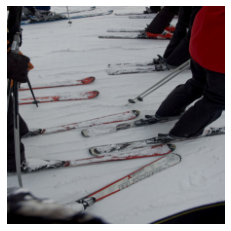

Q: is there a map of the world on the back wall ?
A: yes


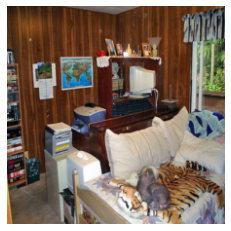

Q: would it be awkward to use this restroom with another person ?
A: no


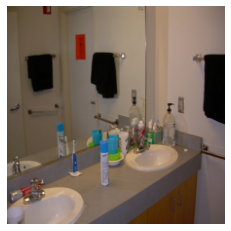

Q: is there a star on the girl ' s t-shirt ?
A: yes


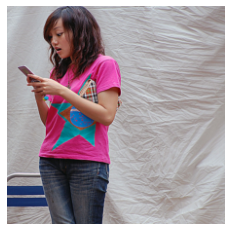

In [7]:
# Visualize some samples
def sequence_to_sentence(seq: List[int]) -> str:
    sentence = []
    for i in seq:
        if i == PAD_IDX:
            break
        sentence.append(vocab.itos[i])
    return ' '.join(sentence)


def visualize_samples(images, questions, answers, max_num=-1):
    if max_num < 0:
        max_num = len(images)

    # PyTorch RNN is using (seq_len, batch, input_size)
    # make it (batch, seq_len, input_size)
    questions = questions.transpose(0, 1)

    for _, v, q, a in zip(range(max_num), images, questions, answers):
        print('Q:', sequence_to_sentence(q))
        print('A:', 'yes' if a > 0 else 'no')
        helper.imshow(v)
        plt.show()


images, questions, answers = next(iter(train_loader))
visualize_samples(images, questions, answers, 4)

## Create Model

In [8]:
import torchvision.models as models

class ImgEncoder(nn.Module):
    def __init__(self, embed_size):
        super(ImgEncoder, self).__init__()
        model = models.vgg19(pretrained=True)
        in_features = model.classifier[-1].in_features
        model.classifier = nn.Sequential(
            *list(model.classifier.children())[:-1])
        self.model = model
        self.fc = nn.Linear(in_features, embed_size)
        
    def forward(self, image):
        with torch.no_grad():
            img_feature = self.model(image)
        img_feature = self.fc(img_feature)
        l2_norm = img_feature.norm(p=2,dim=1,keepdim=True).detach()
        img_feature = img_feature.div(l2_norm)
        return img_feature
    
class QstEncoder(nn.Module):
    def __init__(self, qst_vocab_size, word_embed_size, embed_size, num_layers, hidden_size):
        super(QstEncoder,self).__init__()
        self.word2vec = nn.Embedding(qst_vocab_size, word_embed_size)
        self.tanh = nn.Tanh()
        self.lstm = nn.LSTM(word_embed_size, hidden_size, num_layers)
        self.fc = nn.Linear(2*num_layers*hidden_size, embed_size) #2 for hidden and cell states
        
    def forward(self, question):
        qst_vec = self.word2vec(question)                             # [batch_size, max_qst_length=30, word_embed_size=300]
        qst_vec = self.tanh(qst_vec)
        qst_vec = qst_vec.transpose(0, 1)                             # [max_qst_length=30, batch_size, word_embed_size=300]
        _, (hidden, cell) = self.lstm(qst_vec)                        # [num_layers=2, batch_size, hidden_size=512]
        qst_feature = torch.cat((hidden, cell), 2)                    # [num_layers=2, batch_size, 2*hidden_size=1024]
        qst_feature = qst_feature.transpose(0, 1)                     # [batch_size, num_layers=2, 2*hidden_size=1024]
        qst_feature = qst_feature.reshape(qst_feature.size()[0], -1)  # [batch_size, 2*num_layers*hidden_size=2048]
        qst_feature = self.tanh(qst_feature)
        qst_feature = self.fc(qst_feature)                            # [batch_size, embed_size]

        return qst_feature
    
class VqaModel(nn.Module):

    def __init__(self, embed_size, qst_vocab_size, ans_vocab_size, word_embed_size, num_layers, hidden_size):

        super(VqaModel, self).__init__()
        self.img_encoder = ImgEncoder(embed_size)
        self.qst_encoder = QstEncoder(qst_vocab_size, word_embed_size, embed_size, num_layers, hidden_size)
        self.tanh = nn.Tanh()
        self.dropout = nn.Dropout(0.5)
        self.fc1 = nn.Linear(embed_size, ans_vocab_size)
        self.sigmoid = nn.Sigmoid()

    def forward(self, img, qst):
        qst = torch.transpose(qst, 0, 1).cuda()
        img_feature = self.img_encoder(img)                     # [batch_size, embed_size]
        qst_feature = self.qst_encoder(qst)                     # [batch_size, embed_size]
        combined_feature = torch.mul(img_feature, qst_feature)  # [batch_size, embed_size]
        combined_feature = self.tanh(combined_feature)
        combined_feature = self.dropout(combined_feature)
        combined_feature = self.fc1(combined_feature)           # [batch_size, ans_vocab_size=1000]
        combined_feature = self.tanh(combined_feature)
        combined_feature = self.dropout(combined_feature)
        combined_feature = self.sigmoid(combined_feature)
        return combined_feature   


In [9]:
model = VqaModel(
        embed_size=1024,
        qst_vocab_size=len(vocab),
        ans_vocab_size=1,
        word_embed_size=300,
        num_layers=2,
        hidden_size=512).to(device)

## Load Pretrained Weights

In [10]:
model = train_util.load_model(model,'./models/mul_vgg_yn_weights.pth')

## Train Model

In [ ]:
criterion = F.binary_cross_entropy
optimizer = optim.Adam(model.parameters())

history = train_util.train_model(
    model, criterion, optimizer,
    train_loader,
    valid_loader,
    epochs=10,
    valid_every=100)

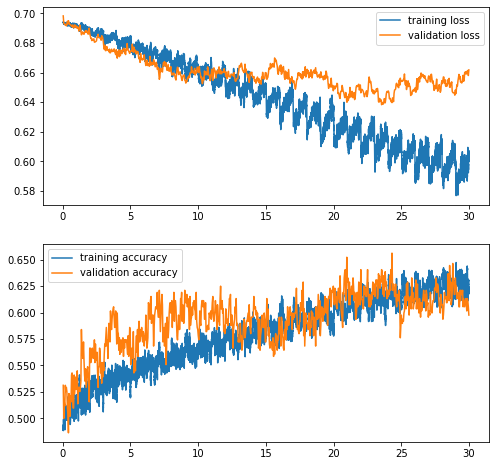

In [15]:
train_util.plot_history(history)

## Test Model

In [11]:
# Accuracy on the validation set
valid_loss, valid_accu = train_util.validate_model(model, valid_loader, F.binary_cross_entropy)
print('loss:', valid_loss)
print('accu:', valid_accu)

loss: 0.640547402203083
accu: 0.65234375


Q: is the child likely to be comfortable with technology as it matures ?
A: yes
Model: yes


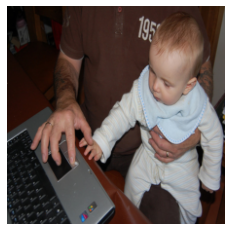

Q: do the bushes impede the proper functioning of this railway system ?
A: no
Model: no


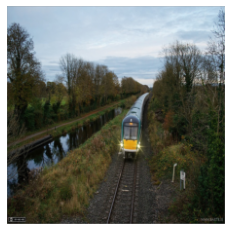

Q: do you think this is his first time on a skateboard ?
A: no
Model: no


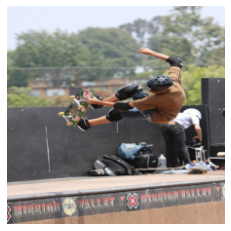

Q: are most of the people in the stands wearing sunglasses ?
A: no
Model: no


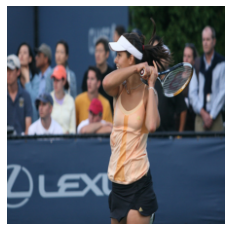

Q: are the trains featured in this picture in motion ?
A: no
Model: yes


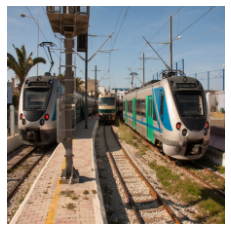

Q: are there any cars parked on the street ?
A: yes
Model: yes


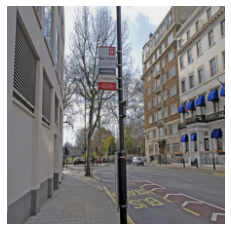

Q: is this man going down a long slope ?
A: yes
Model: yes


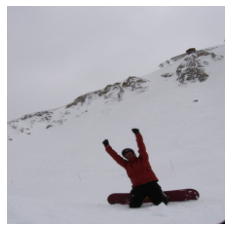

Q: does this look like a healthy meal ?
A: yes
Model: yes


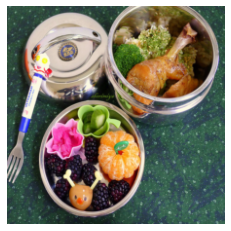

Q: are there many buildings in the picture ?
A: yes
Model: yes


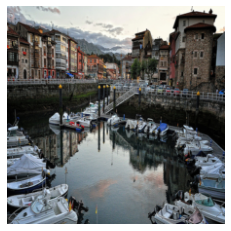

Q: does the kid like to fly kites ?
A: yes
Model: yes


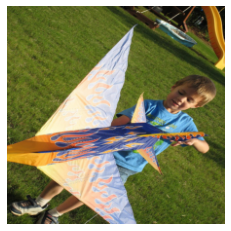

Q: is the woman talking on the phone ?
A: no
Model: no


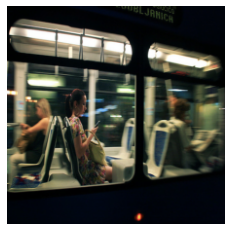

Q: are they both facing the same way ?
A: no
Model: yes


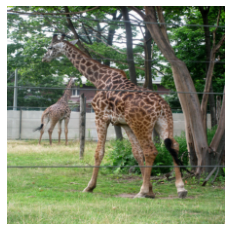

Q: does the sign show signs of vandalism ?
A: no
Model: no


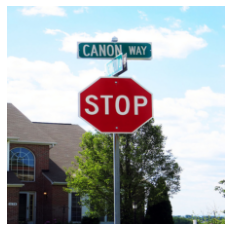

Q: are all the bricks the same color ?
A: no
Model: no


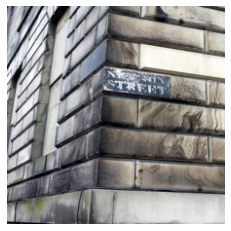

Q: is there a shower in this room ?
A: yes
Model: yes


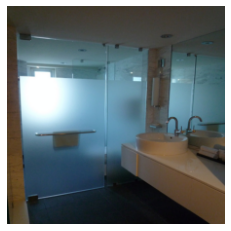

Q: are there any files in the bookcase ?
A: no
Model: no


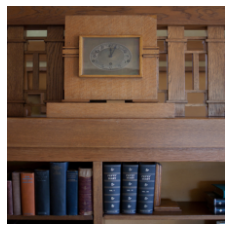

Q: are the vehicles part of a train ?
A: yes
Model: no


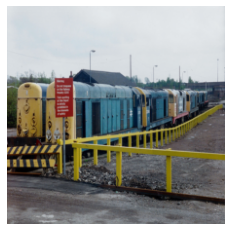

Q: does the counter have any free space ?
A: yes
Model: yes


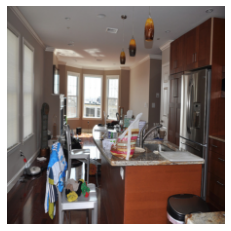

Q: is there light coming through the windows ?
A: no
Model: no


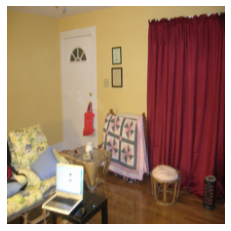

Q: is the woman facing the camera ?
A: yes
Model: no


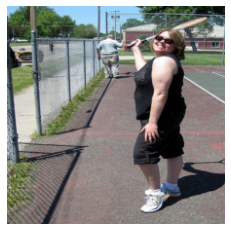

Q: is the price for bananas shown ?
A: yes
Model: no


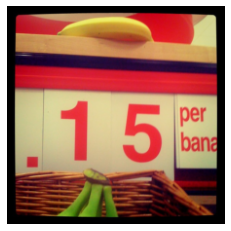

Q: did the woman catch the frisbee ?
A: yes
Model: yes


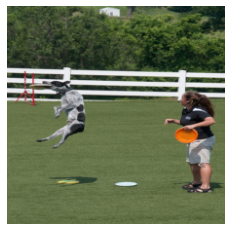

Q: is this person wearing a wetsuit ?
A: no
Model: yes


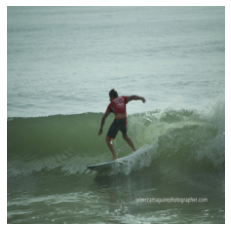

Q: are these people in the city ?
A: no
Model: no


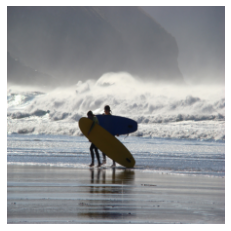

Q: is there milk on the counter ?
A: no
Model: no


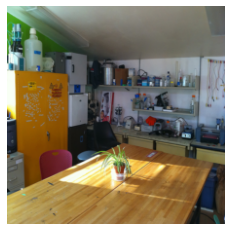

Q: are these pigeons at the beach ?
A: no
Model: no


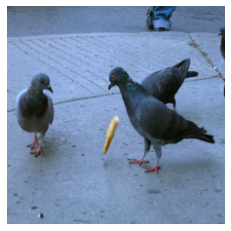

Q: does it appear water is nearby ?
A: yes
Model: no


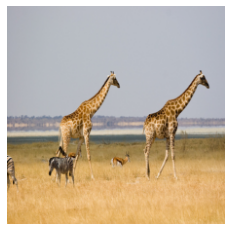

Q: has the hamburger been cooked yet ?
A: no
Model: no


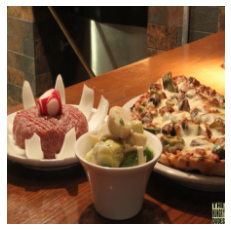

Q: are there toys in the basket ?
A: no
Model: no


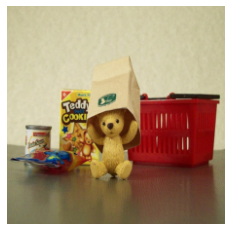

Q: is it raining in the picture ?
A: no
Model: no


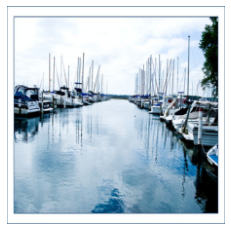

Q: are mushrooms part of this dish ?
A: no
Model: yes


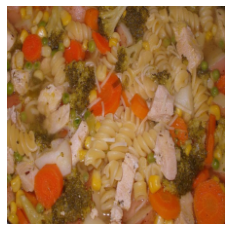

Q: is this guy eating a doughnut ?
A: yes
Model: no


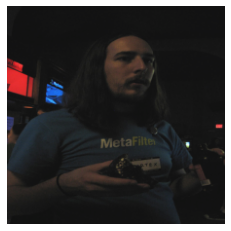

Q: is the child holding the umbrella ?
A: no
Model: no


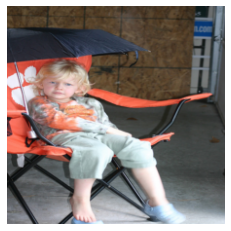

Q: are these two women considered attractive ?
A: yes
Model: yes


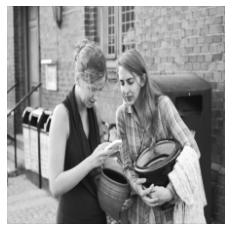

Q: is this pizza unusually large ?
A: yes
Model: yes


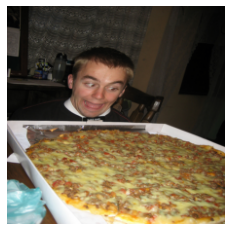

Q: is this a grass court ?
A: no
Model: no


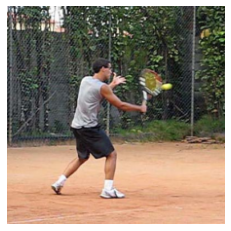

Q: is this boy wearing shorts ?
A: no
Model: no


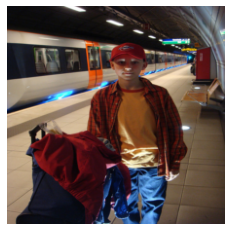

Q: is there a computer here ?
A: yes
Model: yes


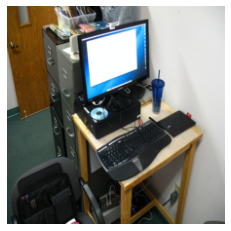

Q: is he riding a wave ?
A: no
Model: no


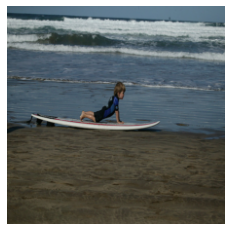

Q: is this a grown bear ?
A: yes
Model: yes


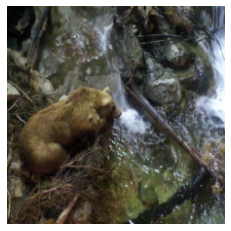

Q: is this an armored truck ?
A: no
Model: no


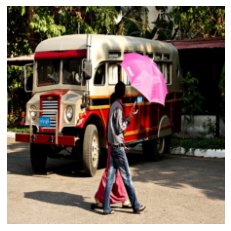

Q: is it a cloudy day ?
A: no
Model: yes


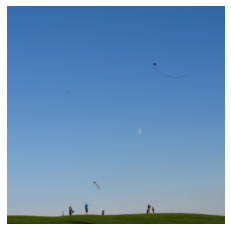

Q: is this bike worn out ?
A: no
Model: no


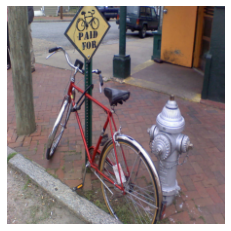

Q: is this a modern kitchen ?
A: yes
Model: yes


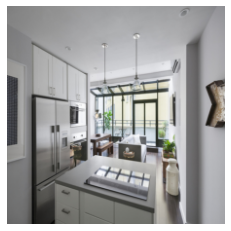

Q: is he a professional player ?
A: yes
Model: yes


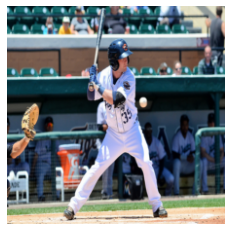

Q: do you see an umpire ?
A: yes
Model: no


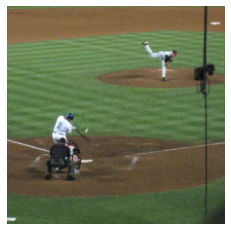

Q: is the child wearing helmet ?
A: no
Model: no


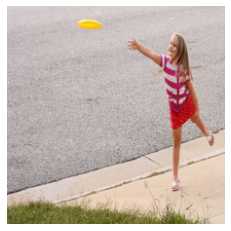

Q: is this a passenger train ?
A: no
Model: yes


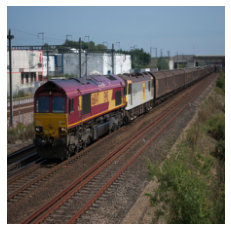

Q: is the cake frosting brown ?
A: yes
Model: yes


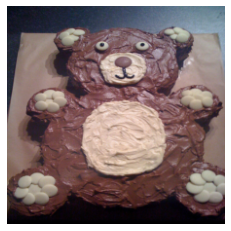

Q: is the woman having fun ?
A: yes
Model: yes


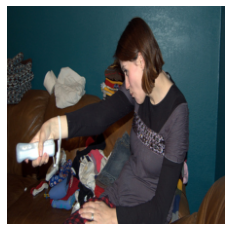

Q: is the street wet ?
A: no
Model: no


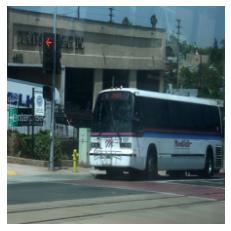

Q: is it snowing outside ?
A: no
Model: no


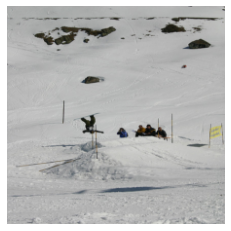

Q: is there a mountain ?
A: no
Model: no


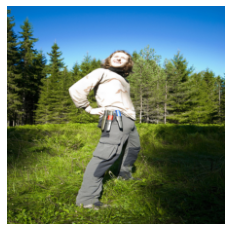

Q: are the waters calm ?
A: no
Model: no


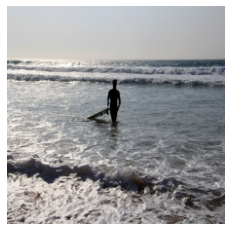

Q: is this a beach ?
A: yes
Model: yes


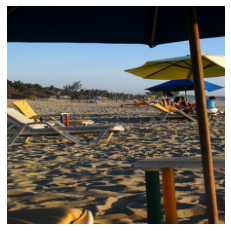

Q: is the lampshade straight ?
A: no
Model: yes


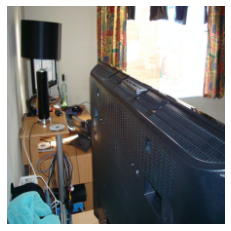

Q: are the lights on ?
A: no
Model: yes


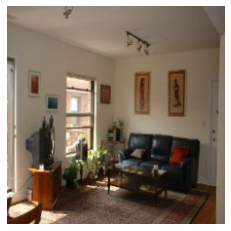

Q: is this a train ?
A: yes
Model: yes


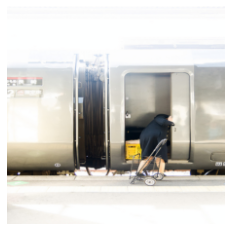

Q: is the bear reading ?
A: yes
Model: yes


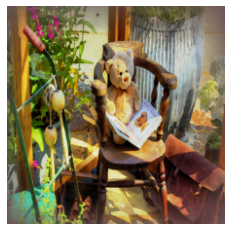

Q: could these be migrating ?
A: no
Model: no


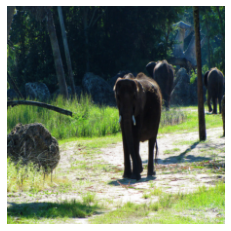

Q: is he wearing glasses ?
A: yes
Model: yes


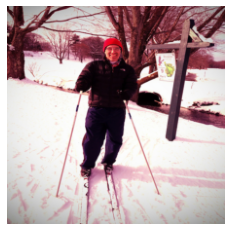

Q: is the horse sad ?
A: no
Model: no


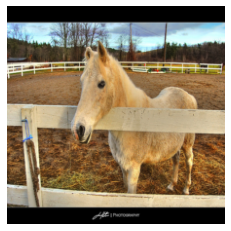

Q: is it sunny ?
A: no
Model: no


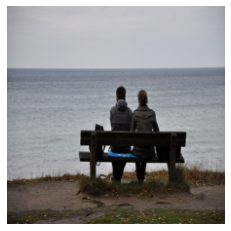

Q: is this serena ?
A: yes
Model: yes


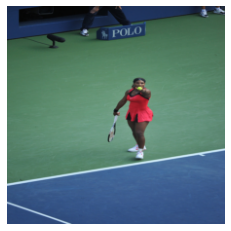

In [12]:
# Plot some samples
images, questions, answers = next(iter(train_loader))
model.eval()
with torch.no_grad():
    outputs = model(images.to(device), questions.to(device)).cpu()

questions = questions.transpose(0, 1)
for v, q, a, pred in zip(images, questions, answers, outputs):
    print('Q:', sequence_to_sentence(q))
    print('A:', 'yes' if a > 0.5 else 'no')
    print('Model:', 'yes' if pred > 0.5 else 'no')
    helper.imshow(v)
    plt.show()